## Importing Modules

In [2]:
%load_ext autoreload
%autoreload 2
import os, sys
sys.path.append('/home/junhokang/script')
import scjp

2022-01-20 08:11:20.033016: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-01-20 08:11:20.033055: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
# useful imports
import numpy as np
import scipy as scipy
import scanpy as sc
import scanpy.external as sce
import pandas as pd
pd.set_option('display.max_rows', 40)
pd.set_option('display.max_columns', None)
import pickle as pkl
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10,8]
import seaborn as sns
from collections import defaultdict, Counter
import networkx as nx
import igraph, re, glob
from bbknn import bbknn
from geosketch import gs
import scrublet as scr
import joblib as jl
from datetime import datetime
def timestamp():
    return datetime.now().strftime("%y%m%d%H%M")
import logging
import scipy.stats
import diffxpy.api as de
from SCCAF import *
import gseapy

In [4]:
# setting scanpy
%matplotlib inline
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, color_map='OrRd')
sc.logging.print_version_and_date()

Running Scanpy 1.8.1, on 2022-01-20 08:11.


In [5]:
nb_name = 'MOG15.v03.cd_GSE134809_MSpub_Fig_211208'
version = '.'.join(nb_name.split('.')[:2])+'.'
data = '_'.join(nb_name.split('.')[-1:][0].split('_')[:-1])
print('Version:', version)
print('Data:', data)

Version: MOG15.v03.
Data: cd_GSE134809_MSpub_Fig


In [6]:
base_folder = '/home/junhokang/projects/02_mogad_new/'

## Loading MS data

In [6]:
ms = sc.read('./write/MOG15.v02.MSpub_reanno_211123.h5ad')

Only considering the two last: ['.MSpub_reanno_211123', '.h5ad'].
Only considering the two last: ['.MSpub_reanno_211123', '.h5ad'].


In [7]:
ms

AnnData object with n_obs × n_vars = 68458 × 1147
    obs: 'Sample', 'PatientID', 'DiseaseCode', 'Diagnosis', 'Tissue', 'Disease', 'Myelin', 'Antibody', 'Gender', 'Source', 'Chemistry', 'dzcode', 'anno_final_211116', 'n_counts', 'n_genes', 'mito', 'doublet_scores', 'predicted_doublets', 'doublet_final', 'anno_predict', 'leiden', 'anno_final.replaced.1', 'anno_final'
    var: 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'ID_colors', 'L1_Round0_self-projection_colors', 'L1_Round1_colors', 'L1_Round1_self-projection_colors', 'L1_Round2_colors', 'L1_Round2_self-projection_colors', 'L1_Round3_colors', 'L1_Round3_self-projection_colors', 'L1_Round4_colors', 'L1_Round4_self-projection_colors', 'L1_Round5_colors', 'L1_Round5_self-projection_colors', 'L1_Round6_colors', 'L1_Round6_self-projection_colors', 'PatientID_colors', 'Sample_colors', 'Tissue_colors', 'anno_final_211116_colors', 'anno_final_colors', 'anno_predict2_colors', 'anno_predict_colors', 'anno_sccaf.replaced

In [8]:
ms.obs['anno_final'].replace({'Myl_tDC':'Myl_ASDC'},inplace=True)

In [33]:
cat=list(sorted(set(ms.obs['anno_final'])))

ms.obs['anno_final']=ms.obs['anno_final'].cat.reorder_categories(cat)

In [377]:
len(set(ms.obs['anno_final']))

25

Text(0.5, 1.0, '')

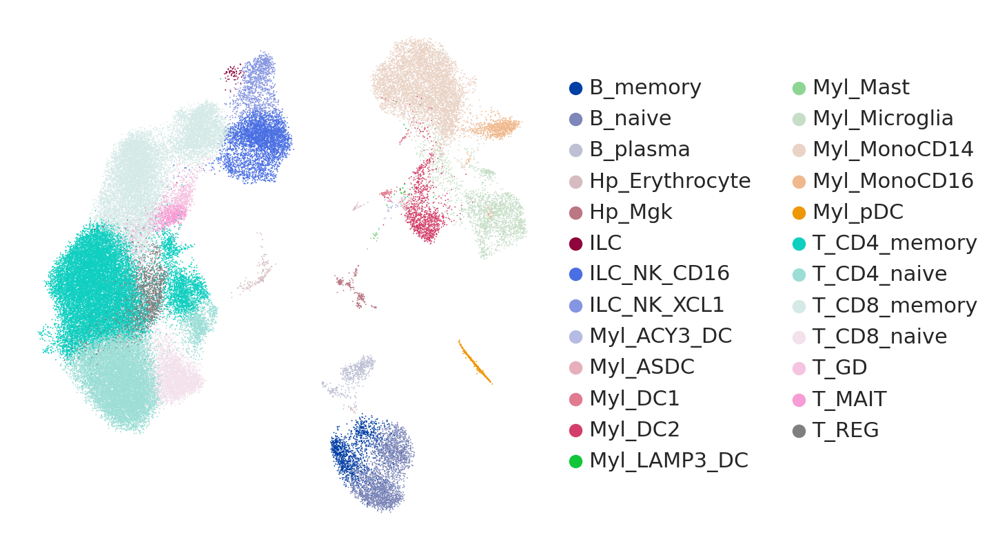

In [379]:
scjp.us(ms,'anno_final',frameon=False)
plt.title('')
#scjp.save_fig('F2E.','UMAP_MSpub',fig_folder='v1_figures')

In [35]:
Myl = [x for x in set(sorted(ms.obs['anno_final'])) if 'Myl_' in x]
mdata = scjp.get_subset(ms,ms.obs['anno_final'].isin(Myl))

extracting highly variable genes
    finished (0:00:01)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
removing cc_genes...
computing PCA
    with n_comps=50
    finished (0:00:16)


In [124]:
mdata

AnnData object with n_obs × n_vars = 10394 × 9123
    obs: 'Sample', 'PatientID', 'DiseaseCode', 'Diagnosis', 'Tissue', 'Disease', 'Myelin', 'Antibody', 'Gender', 'Source', 'Chemistry', 'dzcode', 'anno_final_211116', 'n_counts', 'n_genes', 'mito', 'doublet_scores', 'predicted_doublets', 'doublet_final', 'anno_predict', 'leiden', 'anno_final.replaced.1', 'anno_final'
    var: 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'anno_final_colors'
    obsm: 'X_pca', 'X_pca_before', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [36]:
scjp.run_harmony(mdata,'PatientID')

2021-12-08 04:14:06,039 - harmonypy - INFO - Iteration 1 of 10
2021-12-08 04:14:09,763 - harmonypy - INFO - Iteration 2 of 10
2021-12-08 04:14:13,405 - harmonypy - INFO - Iteration 3 of 10
2021-12-08 04:14:17,102 - harmonypy - INFO - Iteration 4 of 10
2021-12-08 04:14:20,289 - harmonypy - INFO - Converged after 4 iterations


calculating neighbors...
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
calculating umap...
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [46]:
colors=['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#ffbb78']

In [48]:
mdata.uns['anno_final_colors']=colors

v1_figures/F2E.UMAP_MSpub.pdf


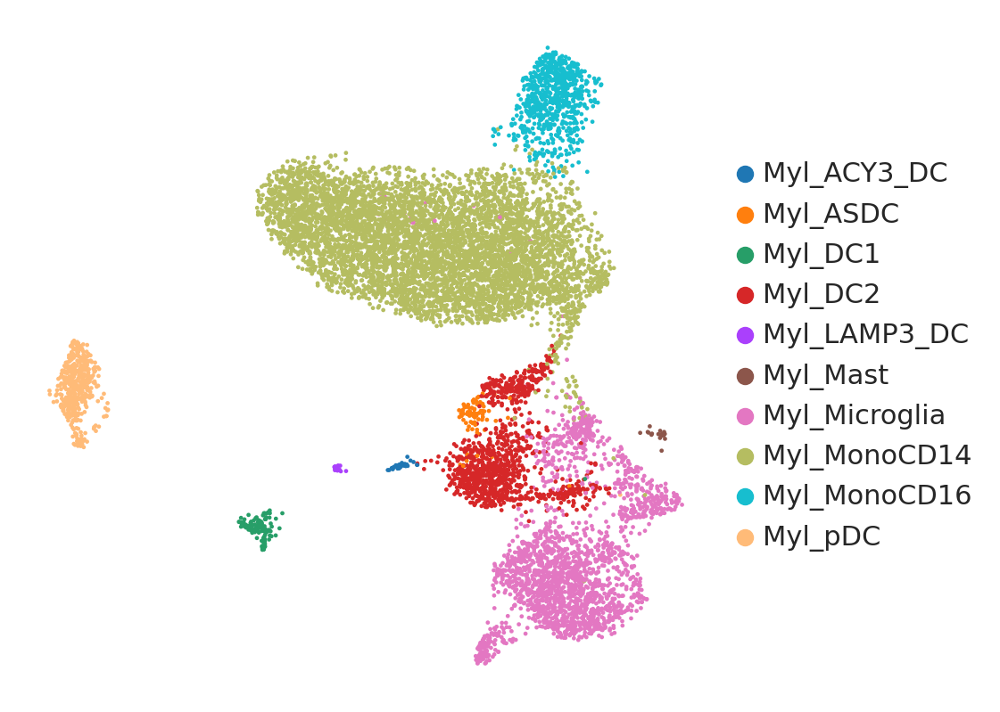

In [55]:
scjp.us(mdata,'anno_final',frameon=False)
plt.title('')
scjp.save_fig('F2E.','UMAP_MSpub',fig_folder='v1_figures')

## Loading Crohn Data

In [7]:
adata = sc.read('./public_data/MOG15.v01.cd_GSE134809_myeloidsub.h5ad')

Only considering the two last: ['.cd_GSE134809_myeloidsub', '.h5ad'].
Only considering the two last: ['.cd_GSE134809_myeloidsub', '.h5ad'].


In [8]:
adata

AnnData object with n_obs × n_vars = 9294 × 8095
    obs: 'n_counts', 'n_genes', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'Disease', 'Sample_ID', 'Tissue', 'Status', 'Patient', 'leiden', 'anno_predict', 'ILC', 'anno_final.replaced.1', 'anno_final'
    var: 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'Status_colors', 'Tissue_colors', 'anno_final_colors', 'cdm_leiden', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_before', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
Counter(adata.obs['Status'])

Counter({'PBMC': 5492, 'Involved': 2374, 'Uninvolved': 1428})

In [145]:
adata.obs['anno_final'].replace({'Myl_tDC':'Myl_ASDC'},inplace=True)

In [146]:
cat=list(sorted(set(adata.obs['anno_final'])))

adata.obs['anno_final']=adata.obs['anno_final'].cat.reorder_categories(cat)

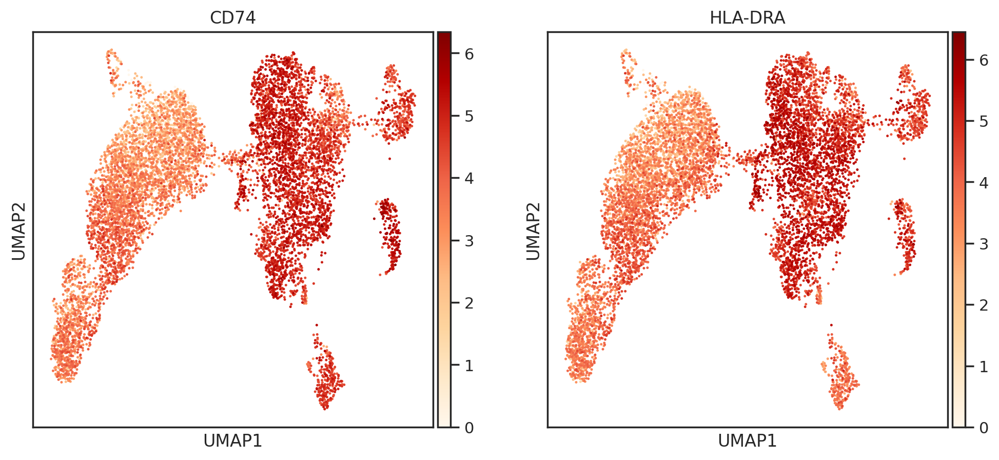

In [189]:
#DC pan
scjp.us(adata,'CD74,HLA-DRA')

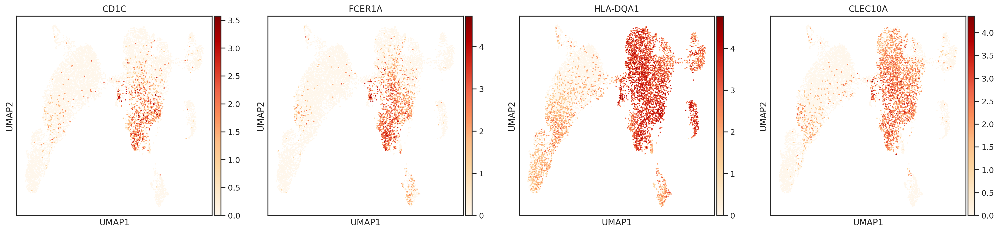

In [186]:
#DC2
scjp.us(adata,'CD1C,FCER1A,HLA-DQA1,CLEC10A')

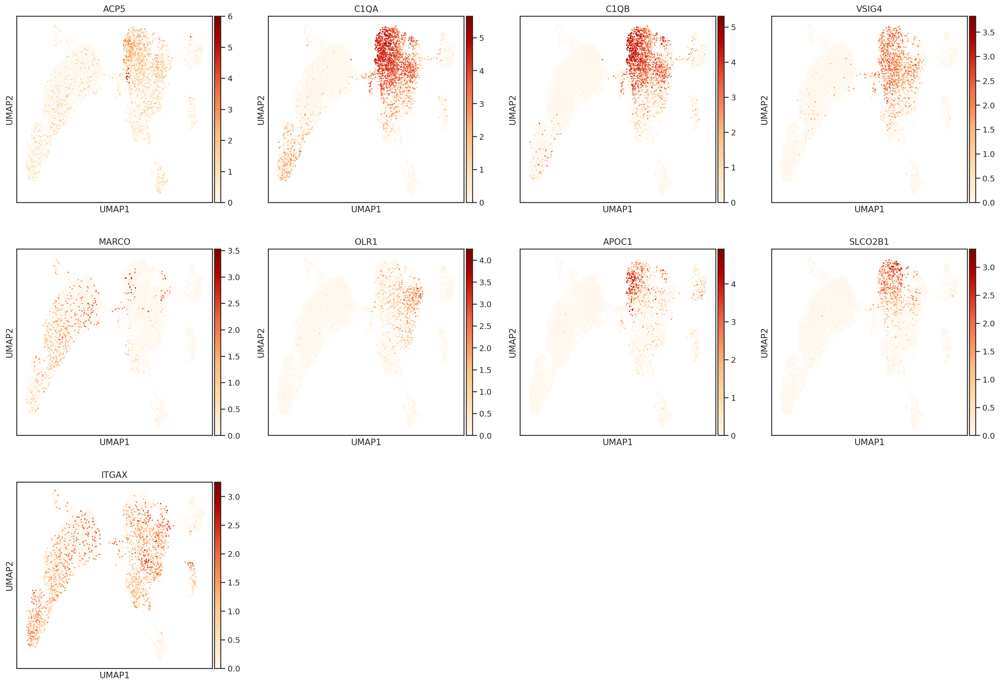

In [188]:
#Macrophage
scjp.us(adata,'ACP5,C1QA,C1QB,VSIG4,MARCO,OLR1,APOC1,SLCO2B1,ITGAX')

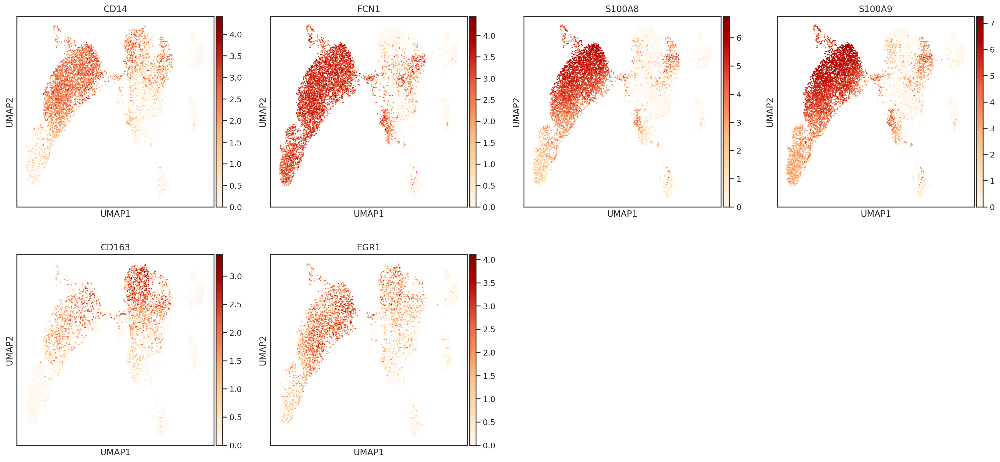

In [194]:
#Mono_CD14
scjp.us(adata,'CD14,FCN1,S100A8,S100A9,CD163,EGR1')

In [190]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


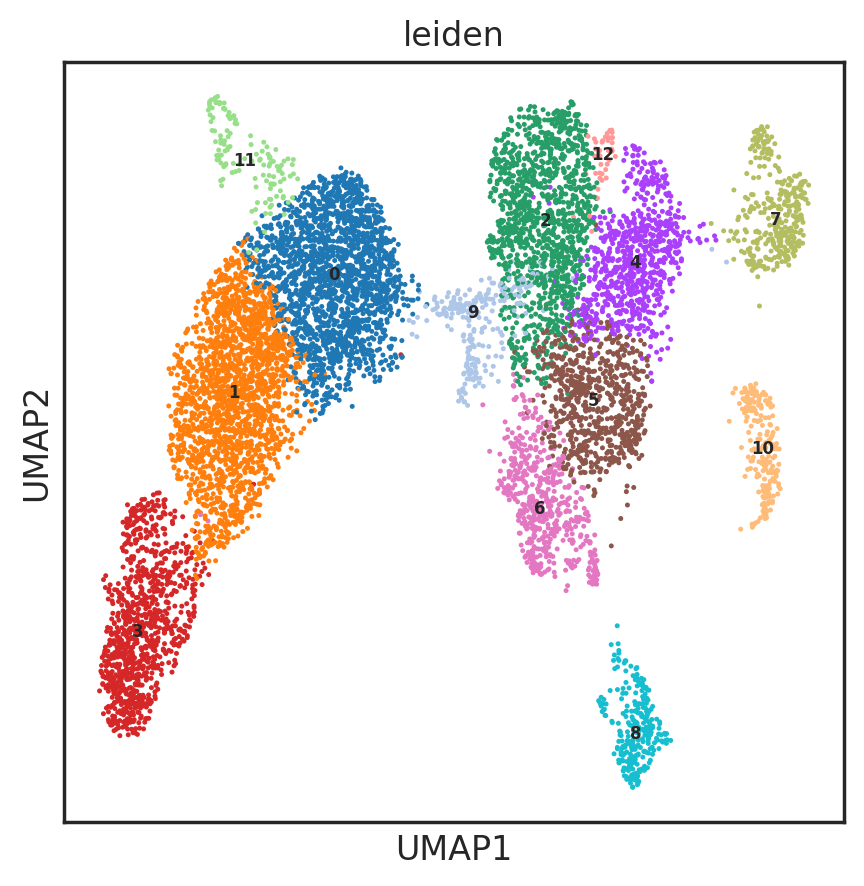

In [192]:
scjp.us(adata,'leiden',legend_loc='on data',legend_fontsize=6)

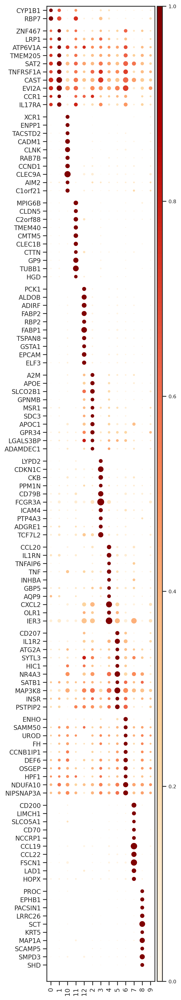

In [193]:
m = scjp.markers.marker(adata,'leiden')
marker = m.plot_marker()

In [196]:
ct_anno = scjp.annotater(adata,'anno_final',old_label='anno_final')

In [203]:
ct_anno.update(adata,'leiden','9','Myl_Infiltrating_Monocyte')
ct_anno.update(adata,'leiden','2','Myl_Macrophage')
ct_anno.update(adata,'leiden','12','Myl_Macrophage')
ct_anno.update(adata,'leiden','4','Myl_Macrophage')
ct_anno.update(adata,'leiden','0','Myl_MonoCD14')

v1_figures/F5A.UMAP_IBD.pdf


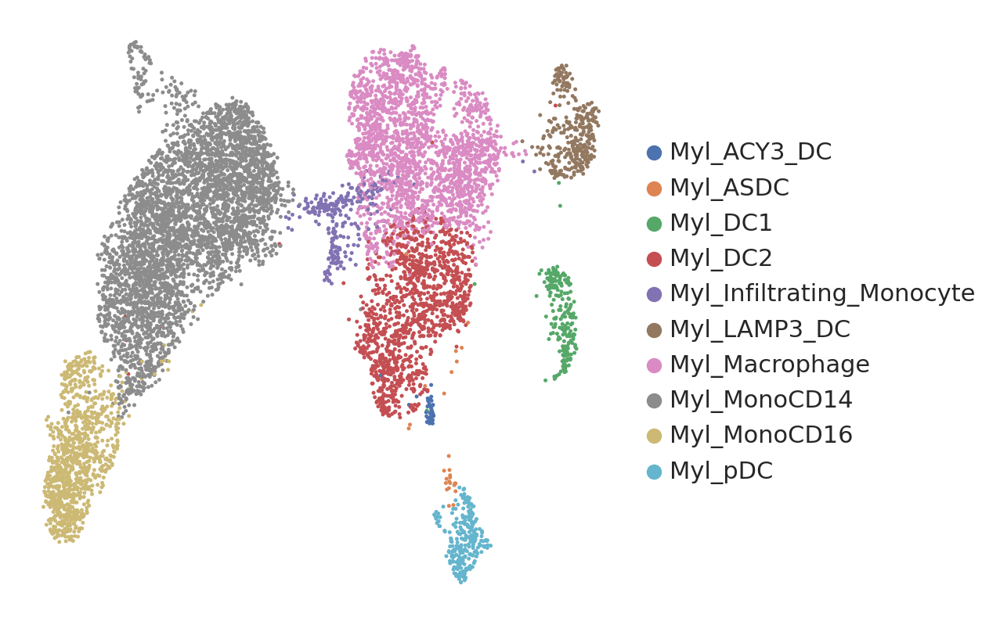

In [334]:
scjp.us(adata,'anno_final',frameon=False)
plt.title('')
scjp.save_fig('F5A.','UMAP_IBD',fig_folder='v1_figures')

v1_figures/F5B.UMAP_tissue.pdf


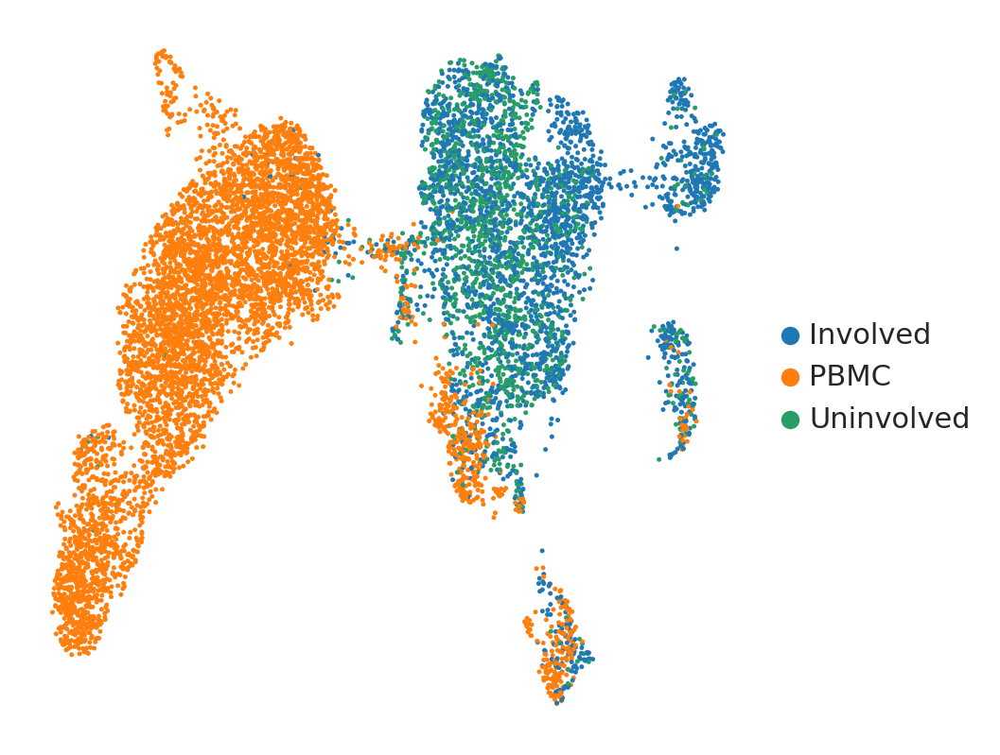

In [335]:
scjp.us(adata,'Status',frameon=False)
plt.title('')
scjp.save_fig('F5B.','UMAP_tissue',fig_folder='v1_figures')

In [357]:
Counter(adata.obs['Status'])

Counter({'PBMC': 5492, 'Involved': 2374, 'Uninvolved': 1428})

In [358]:
adata

AnnData object with n_obs × n_vars = 9294 × 8095
    obs: 'n_counts', 'n_genes', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'Disease', 'Sample_ID', 'Tissue', 'Status', 'Patient', 'leiden', 'anno_predict', 'ILC', 'anno_final.replaced.1', 'anno_final'
    var: 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'Status_colors', 'Tissue_colors', 'anno_final_colors', 'neighbors', 'pca', 'umap', 'leiden', 'leiden_colors', 'cdm_leiden'
    obsm: 'X_pca', 'X_pca_before', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [208]:
color_total={a:b for a,b in zip (sorted(set(adata.obs['Status'])),adata.uns['Status_colors'])}

### DC subset

In [224]:
dc = [x for x in set(sorted(adata.obs['anno_final'])) if 'DC' in x]
dcdata = adata[(adata.obs['anno_final'].isin(dc)) & (adata.obs['Status']!='PBMC')]

In [226]:
dcdata

View of AnnData object with n_obs × n_vars = 1551 × 8095
    obs: 'n_counts', 'n_genes', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'Disease', 'Sample_ID', 'Tissue', 'Status', 'Patient', 'leiden', 'anno_predict', 'ILC', 'anno_final.replaced.1', 'anno_final'
    var: 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'Status_colors', 'Tissue_colors', 'anno_final_colors', 'neighbors', 'pca', 'umap', 'leiden', 'leiden_colors', 'cdm_leiden'
    obsm: 'X_pca', 'X_pca_before', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [227]:
cell_list = sorted(list(set(dcdata.obs['anno_final'])))
Patient = {i:z for i,z in zip(dcdata.obs.Sample_ID,dcdata.obs.Patient)}
Status = {i:z for i,z in zip(dcdata.obs.Sample_ID,dcdata.obs.Status)}

In [229]:
prop = pd.crosstab(dcdata.obs['Status'], dcdata.obs['anno_final'], normalize=0)
dc_df = prop.reset_index().melt(id_vars='Status')

In [427]:
sns.set(rc={'figure.figsize':(3,5)})
for f in 'Myl_ASDC,Myl_ACY3_DC,Myl_LAMP3_DC'.split(','):
    df=dc_df[dc_df['anno_final']==f]
    sns.set_style('ticks')
    plt.bar(df['Status'][::-1],df['value'][::-1],color=['#279e68','#1f77b4'],width=0.6)
    plt.title("Cell proportion, {}".format(f))
    plt.ylabel('Proportion (%)', fontsize=15)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    sns.despine()
    scjp.save_fig('F5E.','{}_barplot'.format(f),fig_folder='v2_figures')
    plt.clf()
    #plt.show()

v2_figures/F5E.Myl_ASDC_barplot.pdf
v2_figures/F5E.Myl_ACY3_DC_barplot.pdf
v2_figures/F5E.Myl_LAMP3_DC_barplot.pdf


<Figure size 300x500 with 0 Axes>

In [400]:
order=['Myl_ACY3_DC','Myl_DC1','Myl_ASDC','Myl_DC2','Myl_LAMP3_DC','Myl_pDC']
dcpie=pd.crosstab(dcdata.obs['Status'],dcdata.obs['anno_final'],normalize=0)[order].T

In [413]:
#Involved
data=list(dcpie.iloc[:,0])
labels=list(dcpie.index)
color={a:b for a,b in zip(sorted(set(adata.obs['anno_final'])),adata.uns['anno_final_colors'])}
dccolor=[color[x] for x in order]

v2_figures/F5E.Pie_involved.pdf


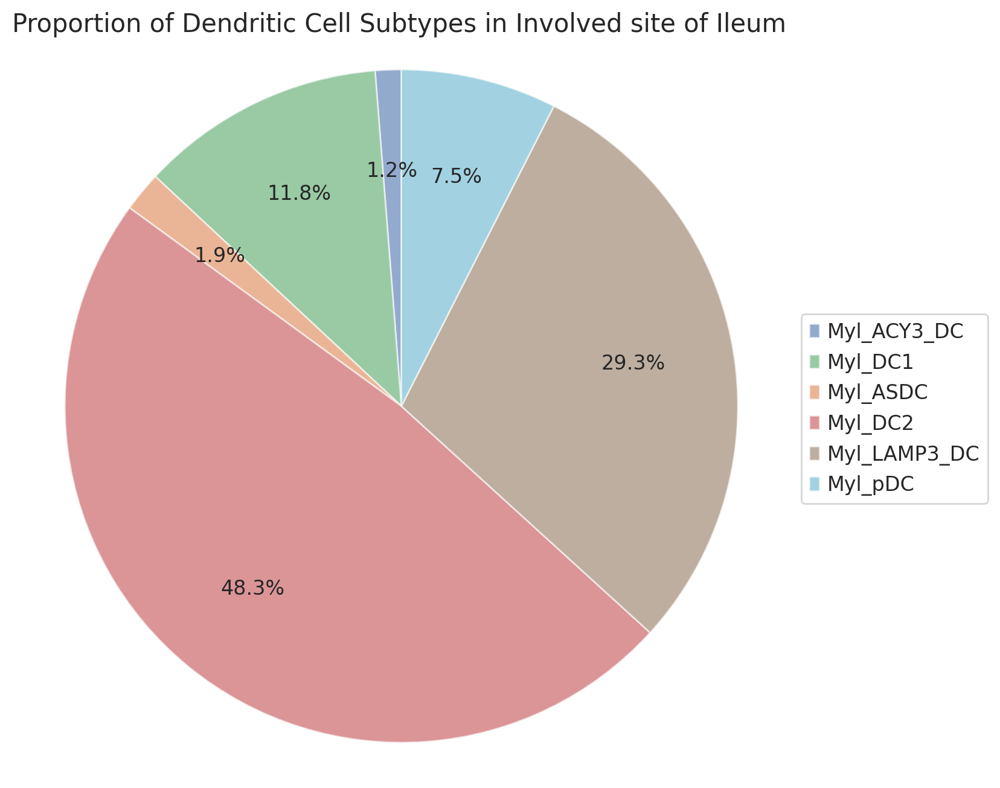

In [414]:
plt.figure(figsize=(8,8))
pie=plt.pie(data,labels=None,colors=dccolor,startangle=90,autopct='%1.1f%%',pctdistance=0.7,wedgeprops={'alpha':0.6})
plt.title('Proportion of Dendritic Cell Subtypes in Involved site of Ileum',fontsize=15)
plt.legend(labels,bbox_to_anchor=(1.02, 0.5),loc='center left',fontsize=12)
plt.axis('equal')
scjp.save_fig('F5E.','Pie_involved',fig_folder='v2_figures')
plt.show()

In [415]:
#Uninvolved
data=list(dcpie.iloc[:,2])
labels=list(dcpie.index)
color={a:b for a,b in zip(sorted(set(adata.obs['anno_final'])),adata.uns['anno_final_colors'])}
dccolor=[color[x] for x in order]

/tmp/ipykernel_43742/882234499.py:2: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  pie=plt.pie(data,labels=None,colors=dccolor,startangle=90,autopct='%1.1f%%',pctdistance=0.7,wedgeprops={'alpha':0.6})


v2_figures/F5E.Pie_uninvolved.pdf


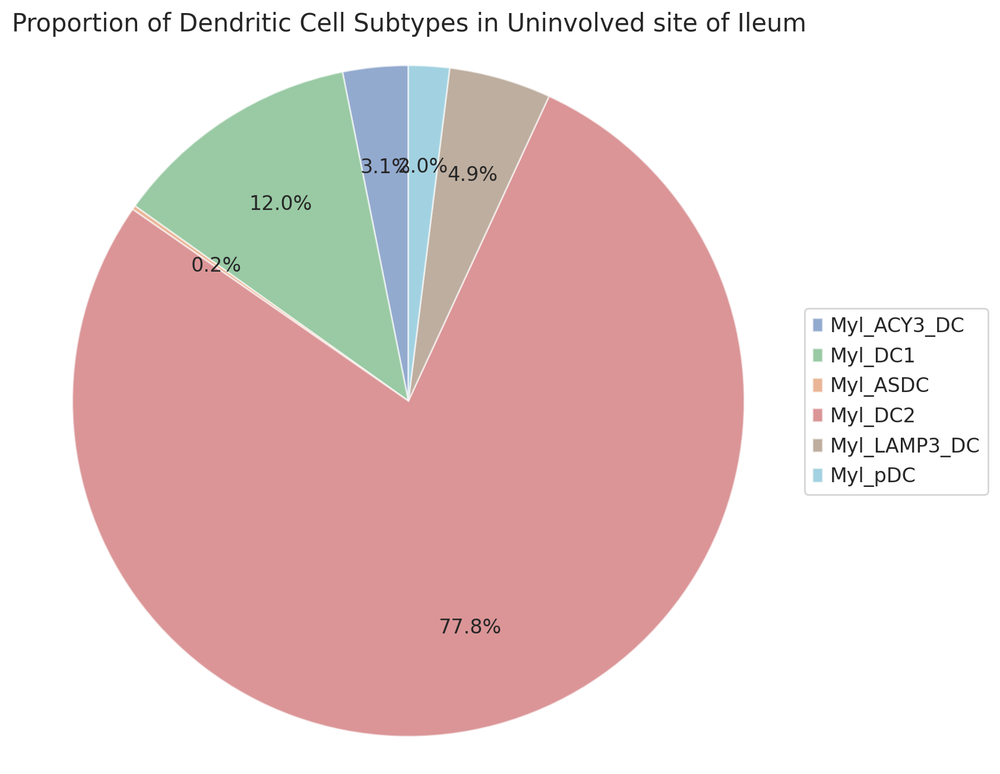

In [416]:
plt.figure(figsize=(8,8))
pie=plt.pie(data,labels=None,colors=dccolor,startangle=90,autopct='%1.1f%%',pctdistance=0.7,wedgeprops={'alpha':0.6})
plt.title('Proportion of Dendritic Cell Subtypes in Uninvolved site of Ileum',fontsize=15)
plt.legend(labels,bbox_to_anchor=(1.02, 0.5),loc='center left',fontsize=12)
plt.axis('equal')
scjp.save_fig('F5E.','Pie_uninvolved',fig_folder='v2_figures')
#plt.show()

In [321]:
dcdata = adata[adata.obs['anno_final'].isin(dc)]

In [371]:
cdm_out = scjp.markers.calculate_markers(dcdata,'anno_final')
markers='ACY3,S100B,KIT,CD1A,CLEC9A,XCR1,CD1C,FCER1A,AXL,SIGLEC6,PPP1R14A,IL3RA,CLEC4C,JCHAIN,LAMP3,CCR7'.split(',')
ctlist='Myl_ACY3_DC,Myl_DC1,Myl_DC2,Myl_ASDC,Myl_pDC,Myl_LAMP3_DC'.split(',')

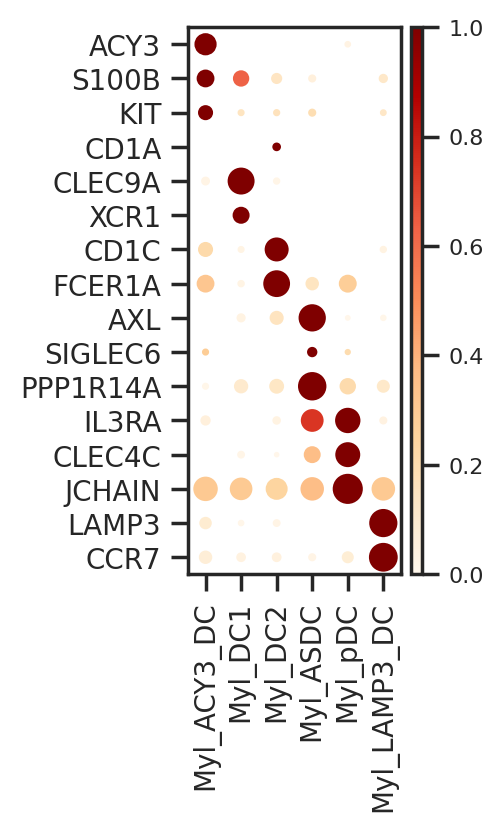

In [372]:
scjp.markers.draw_marker_blob_v2(dcdata,cdm_out,markers,ctlist=ctlist,show=False)
#scjp.save_fig('F5C.','Dotplot_IBD',fig_folder='v1_figures')

v1_figures/F4D.UMAP_ACY3.pdf


<Figure size 900x600 with 0 Axes>

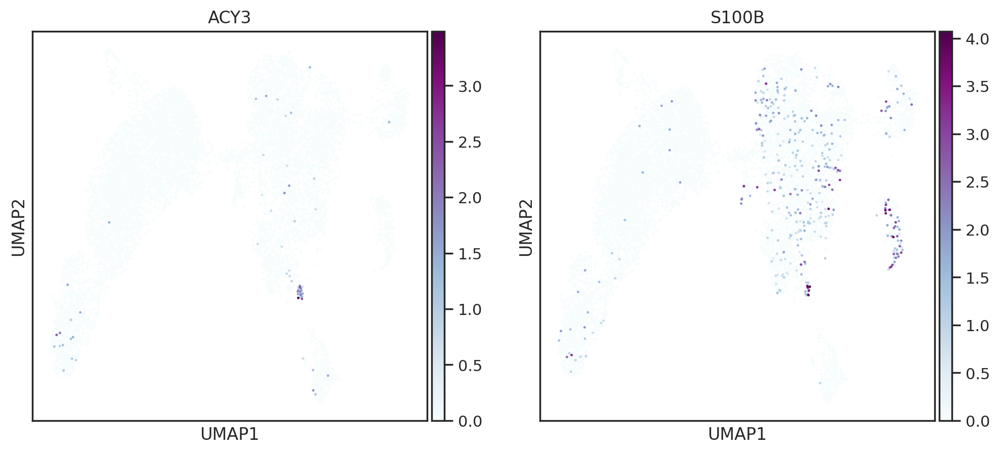

In [72]:
plt.figure(figsize=(9,6))
scjp.us(adata,'ACY3,S100B',cmap='BuPu')
scjp.save_fig('F5D.','UMAP_ACY3',fig_folder='v1_figures')

v1_figures/F4D.UMAP_ASDC.pdf


<Figure size 900x600 with 0 Axes>

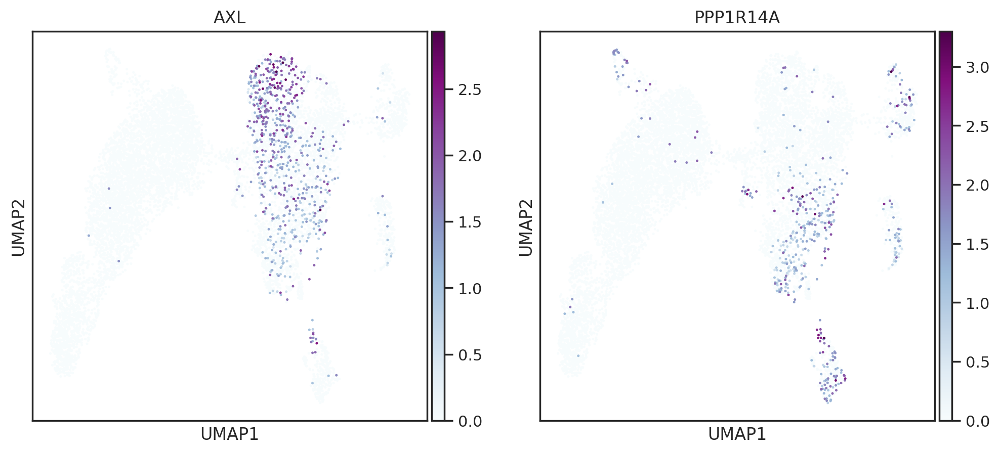

In [73]:
plt.figure(figsize=(9,6))
scjp.us(adata,'AXL,PPP1R14A',cmap='BuPu')
scjp.save_fig('F5D.','UMAP_ASDC',fig_folder='v1_figures')

## Natalizumab dataset

In [80]:
nat = sc.read('./public_data/MOG15.v01.ms_GSE144744_myeloidsub.h5ad')

Only considering the two last: ['.ms_GSE144744_myeloidsub', '.h5ad'].
Only considering the two last: ['.ms_GSE144744_myeloidsub', '.h5ad'].


In [81]:
nat

AnnData object with n_obs × n_vars = 21474 × 7312
    obs: 'donor', 'sample', 'sample_10X', 'HASH', 'match', 'batch_pair', 'group', 'cohort', 'V_10X', 'exp_name', 'nFeature_RNA', 'nCount_RNA', 'nCount_ADT', 'percent_mito', 'anno_final', 'cluster_names', 'sample_date', 'birth_year', 'age_sampling', 'sex', 'EDSS', 'MRI_n_CE_lesions', 'disease_onset', 'prev_treatments', 'natalizumab_treatment', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'ILC', 'doublet_scores', 'total_counts_mt', 'pct_counts_mt', 'anno_predict', 'sub', 'status'
    var: 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'anno_final_colors', 'donor_colors', 'group_colors', 'neighbors', 'pca', 'status_colors', 'umap'
    obsm: 'X_pca', 'X_pca_before', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

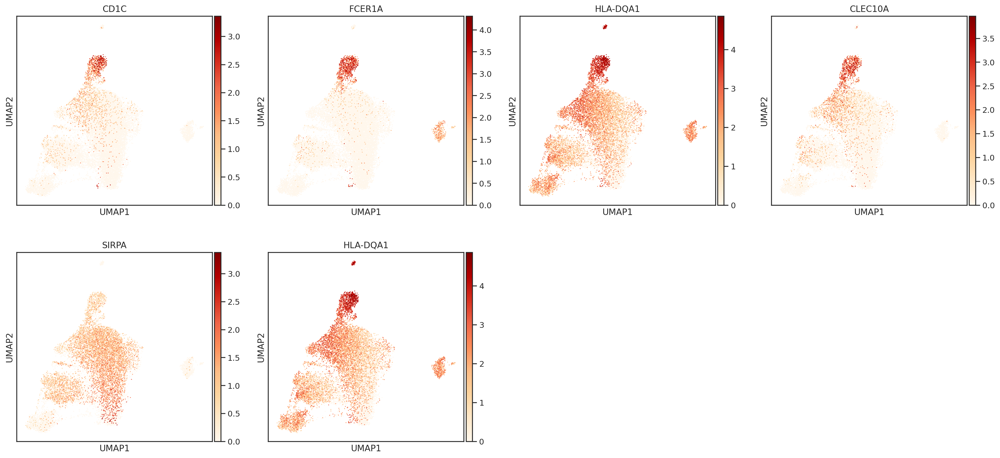

In [84]:
#cDC2
scjp.us(nat,'CD1C,FCER1A,HLA-DQA1,CLEC10A,SIRPA,HLA-DQA1')

In [417]:
cdm_out = scjp.markers.calculate_markers(nat,'anno_final')

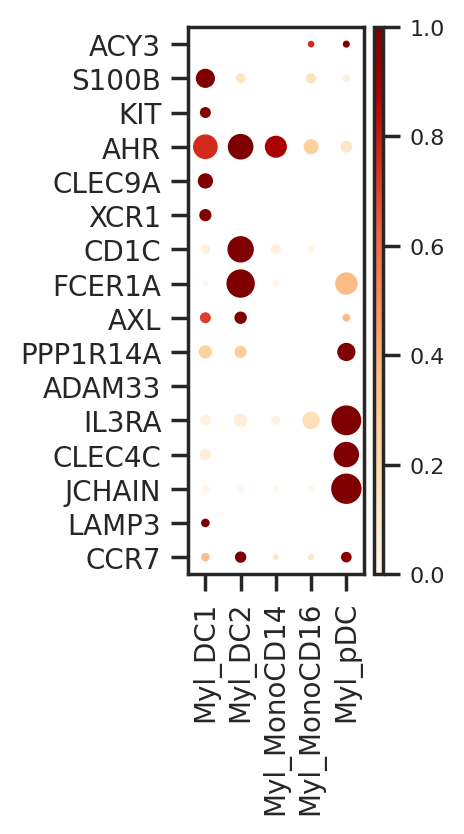

In [422]:
markers='ACY3,S100B,KIT,AHR,CLEC9A,XCR1,CD1C,FCER1A,AXL,PPP1R14A,ADAM33,IL3RA,CLEC4C,JCHAIN,LAMP3,CCR7'.split(',')
scjp.markers.draw_marker_blob_v2(nat,cdm_out,markers,show=False)

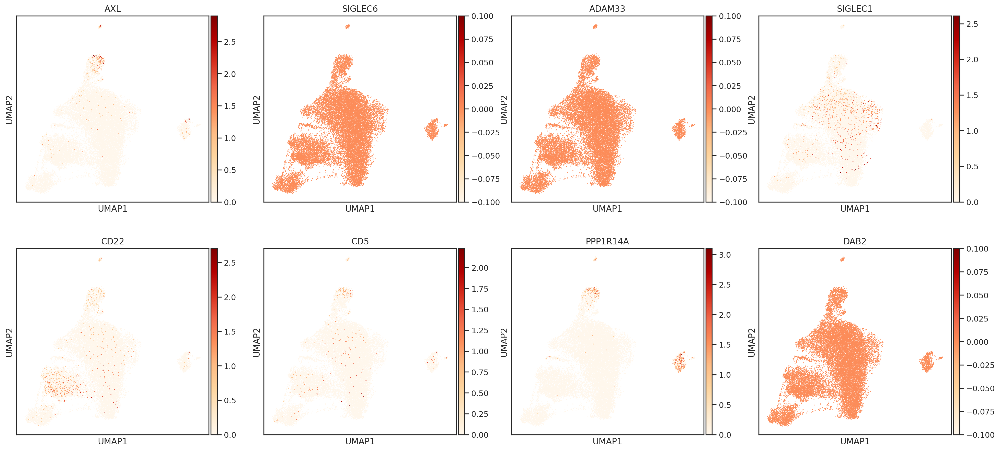

In [85]:
#DC_CD5
scjp.us(nat,'AXL,SIGLEC6,ADAM33,SIGLEC1,CD22,CD5,PPP1R14A,DAB2')

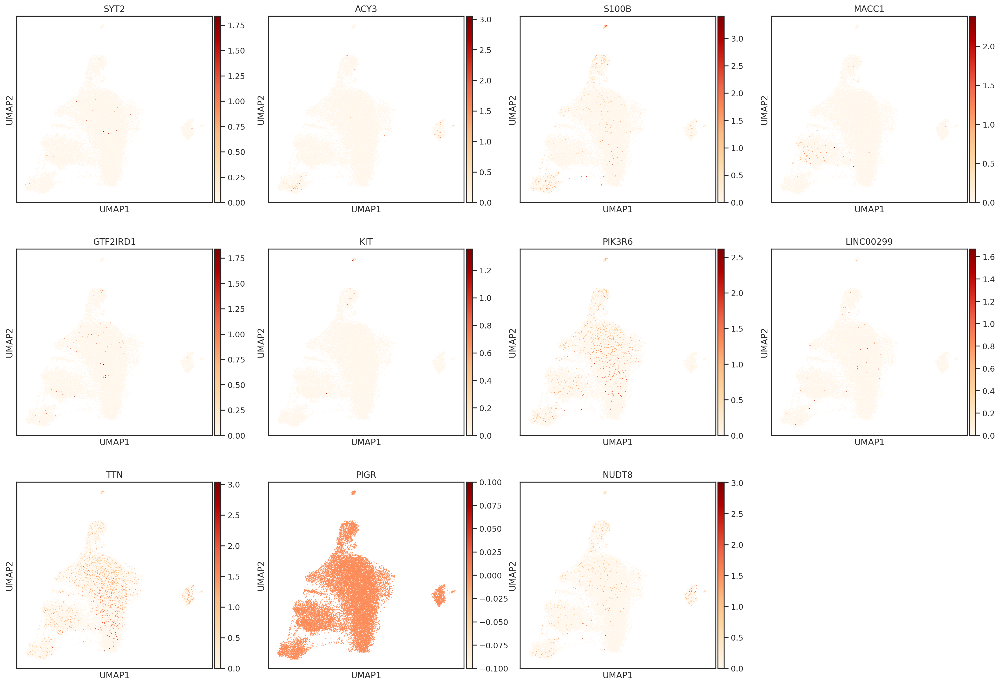

In [87]:
#ACY3_DC
scjp.us(nat,'SYT2,ACY3,S100B,MACC1,GTF2IRD1,KIT,PIK3R6,LINC00299,TTN,PIGR,NUDT8')

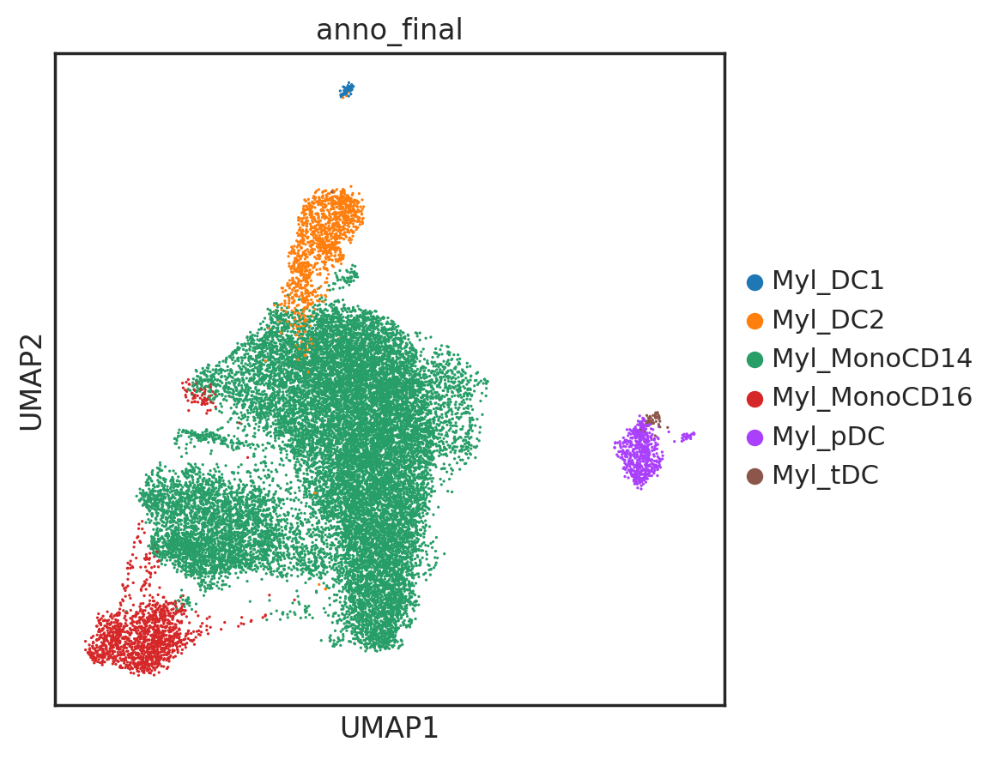

In [82]:
scjp.us(nat,'anno_final')

In [369]:
cdm_out = scjp.markers.calculate_markers(nat,'anno_final')

/home/junhokang/script/scjp/markers.py:443: RuntimeWarning: invalid value encountered in true_divide
  y1.extend(list(y0/ymax))


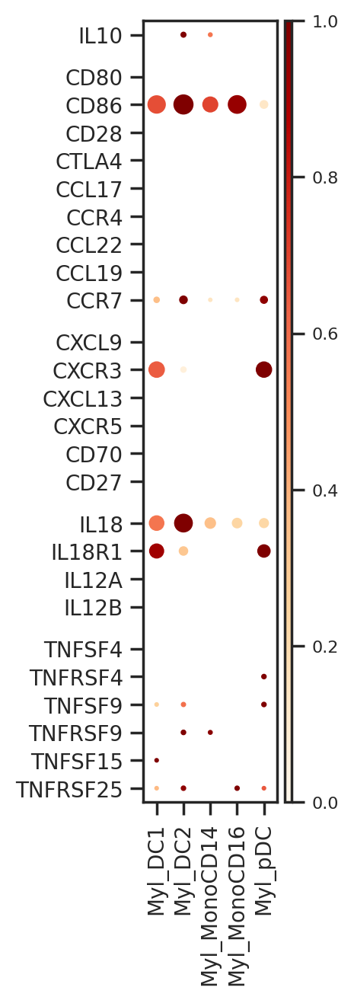

In [370]:
markers='IL10, ,CD80,CD86,CD28,CTLA4,CCL17,CCR4,CCL22,CCL19,CCR7, ,CXCL9,CXCR3,CXCL13,CXCR5,CD70,CD27, ,IL18,IL18R1,IL12A,IL12B, ,TNFSF4,TNFRSF4,TNFSF9,TNFRSF9,TNFSF15,TNFRSF25'.split(',')
scjp.markers.draw_marker_blob_v2(nat,cdm_out,markers,show=False)

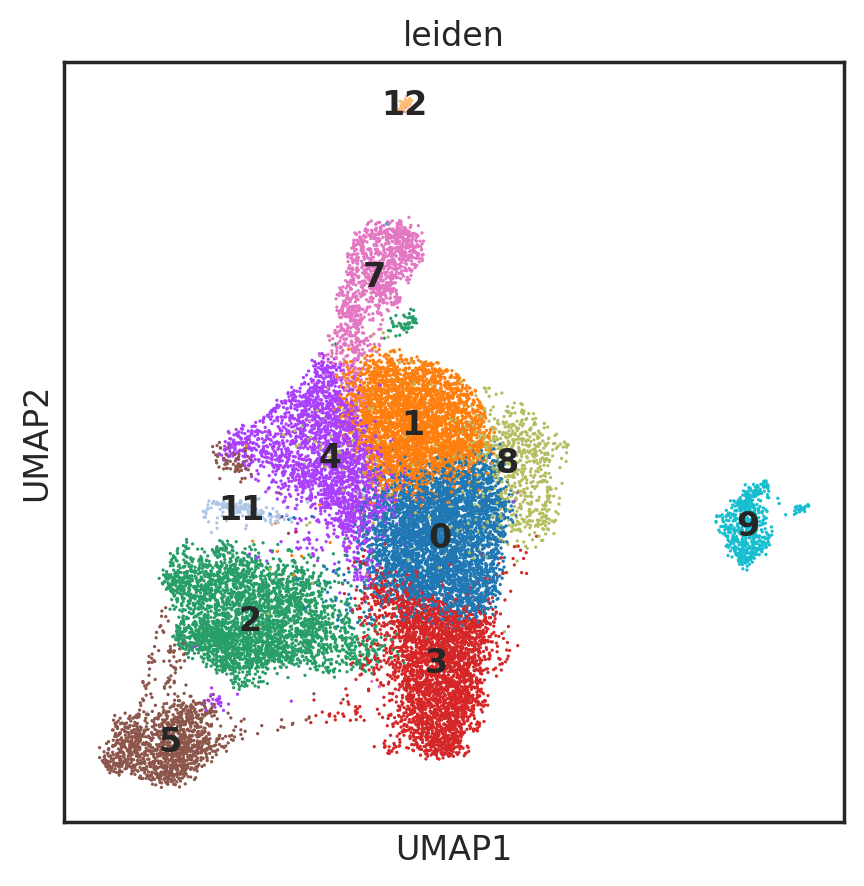

In [89]:
scjp.us(nat,'leiden',legend_loc='on data')

In [88]:
ct_anno = scjp.annotater(nat,'anno_final',old_label='anno_final')

In [91]:
ct_anno.update(nat,'leiden','9','Myl_pDC')

v1_figures/SF4A.UMAP_nat.pdf


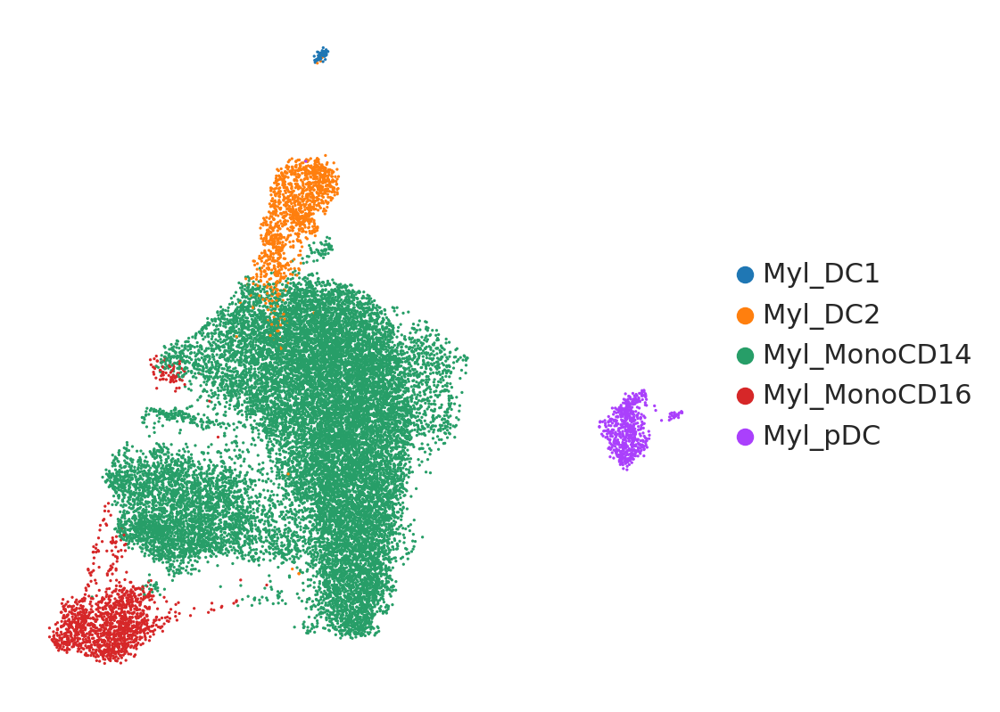

In [94]:
scjp.us(nat,'anno_final',frameon=False)
plt.title('')
scjp.save_fig('SF4A.','UMAP_nat',fig_folder='v1_figures')

<Figure size 1200x600 with 0 Axes>

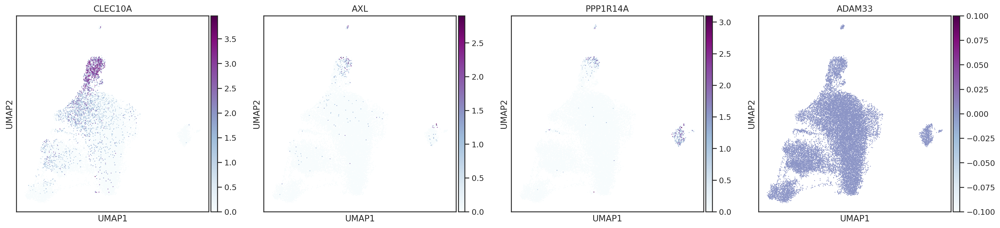

In [423]:
plt.figure(figsize=(12,6))
scjp.us(nat,'CLEC10A,AXL,PPP1R14A,ADAM33',cmap='BuPu')
#scjp.save_fig('SF4B.','UMAP_ASDC',fig_folder='v1_figures')

v1_figures/SF4B.UMAP_ACYLAMP.pdf


<Figure size 1200x600 with 0 Axes>

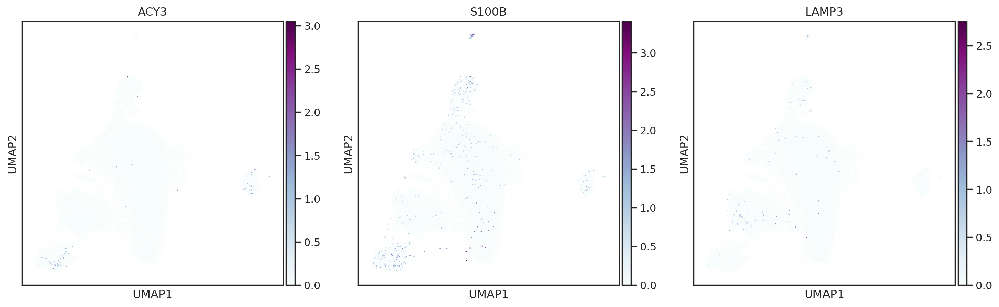

In [319]:
plt.figure(figsize=(12,6))
scjp.us(nat,'ACY3,S100B,LAMP3',cmap='BuPu')
scjp.save_fig('SF4B.','UMAP_ACYLAMP',fig_folder='v1_figures')

In [266]:
natsub=nat[(nat.obs['status']!='Healthy') & (nat.obs['anno_final']=='Myl_DC2')]

In [259]:
set(natsub.obs['status'])

{'MS postTx', 'MS preTx'}

In [270]:
set(natsub.obs['status'])

{'MS postTx', 'MS preTx'}

In [315]:
volcano = scjp.jhk.sample_volcano(natsub,patient_id='sample',anno_key='status',comp1='MS postTx',comp2='MS preTx',quick=True)

v1_figures/SF4C.Natalizumab_volcano.pdf


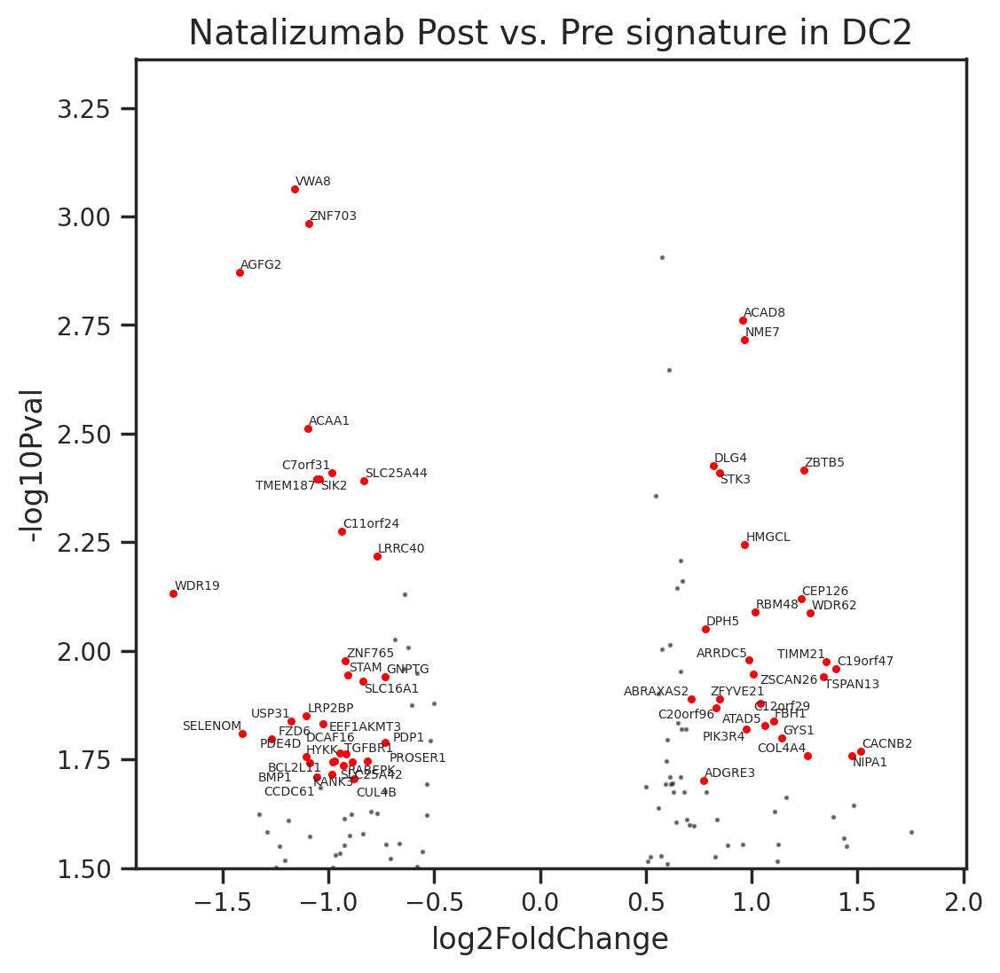

In [316]:
volcano.draw(title='Natalizumab Post vs. Pre signature in DC2',sig_mode='pval',x_pos=0.7,pvalue_cut=1.7,show=False)
scjp.save_fig('SF4C.','Natalizumab_volcano',fig_folder='v1_figures')

In [312]:
df = pd.DataFrame([x for x in zip(volcano.genelist,volcano.fc,volcano.pval)],columns=['Gene','Foldchange','pvalue'])
pos_genes=df[(df['Foldchange']>0.5) & (df['pvalue']<0.05)].sort_values('pvalue')

In [313]:
ASDC='AXL,SIGLEC6,ADAM33,SIGLEC1,CD22,CD5,PPP1R14A,DAB2'.split(',')
df[df['Gene'].isin(ASDC)]

,Gene,Foldchange,pvalue
9729,DAB2,0.000000,1.000000
19815,CD5,0.109452,0.810039
31863,CD22,-0.498704,0.265532
31988,PPP1R14A,0.084043,0.861149
32103,AXL,-0.223375,0.685064
32556,SIGLEC6,0.000000,1.000000
32960,ADAM33,0.000000,1.000000
32961,SIGLEC1,0.343151,0.635905
